<a href="https://colab.research.google.com/github/GJ-007-sage/Generative-Models-/blob/main/AAssignment_02_(2).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
import os
import time
import matplotlib.pyplot as plt
import os
import time
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

In [ ]:
# Load CIFAR-10 dataset
(train_images, _), (_, _) = tf.keras.datasets.cifar10.load_data()

# Normalize images to the range [-1, 1]
train_images = train_images.astype('float32')
train_images = (train_images - 127.5) / 127.5

# Reshape to add channel dimension (batch_size, 32, 32, 3)
train_images = train_images.reshape(train_images.shape[0], 32, 32, 3)

# Batch the data using tf.data.Dataset
BUFFER_SIZE = 60000
BATCH_SIZE = 256
train_dataset = tf.data.Dataset.from_tensor_slices(train_images).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)


170498071/170498071 ━━━━━━━━━━━━━━━━━━━━ 13s 0us/step


In [ ]:
def make_generator_model():
    model = tf.keras.Sequential()
    model.add(tf.keras.layers.Dense(8*8*256, use_bias=False, input_shape=(100,)))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.ReLU())

    model.add(tf.keras.layers.Reshape((8, 8, 256)))
    assert model.output_shape == (None, 8, 8, 256)

    model.add(tf.keras.layers.Conv2DTranspose(128, (5, 5), strides=(1, 1), padding='same', use_bias=False))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.ReLU())

    model.add(tf.keras.layers.Conv2DTranspose(64, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.ReLU())

    model.add(tf.keras.layers.Conv2DTranspose(3, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh'))

    assert model.output_shape == (None, 32, 32, 3)
    return model


In [ ]:
def make_discriminator_model():
    model = tf.keras.Sequential()
    model.add(tf.keras.layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same', input_shape=[32, 32, 3]))
    model.add(tf.keras.layers.LeakyReLU(alpha=0.2))
    model.add(tf.keras.layers.Dropout(0.3))

    model.add(tf.keras.layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(tf.keras.layers.LeakyReLU(alpha=0.2))
    model.add(tf.keras.layers.Dropout(0.3))

    model.add(tf.keras.layers.Flatten())
    model.add(tf.keras.layers.Dense(1))

    return model


In [ ]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

# Optimizers
generator = make_generator_model()
discriminator = make_discriminator_model()

generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.10/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


In [ ]:
@tf.function
def train_step(images):
    noise = tf.random.normal([BATCH_SIZE, 100])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training=True)

        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)

        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    return gen_loss, disc_loss


Epoch 1, Generator Loss: 2.9771008491516113, Discriminator Loss: 0.1401224434375763


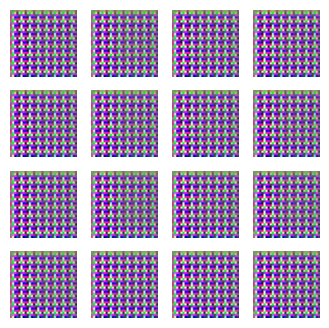

Time for epoch 1: 21.441935300827026 sec
Time for epoch 2: 10.818856000900269 sec
Time for epoch 3: 10.896332740783691 sec
Time for epoch 4: 11.027986764907837 sec
Time for epoch 5: 11.167918920516968 sec
Epoch 6, Generator Loss: 2.5410356521606445, Discriminator Loss: 0.27990126609802246


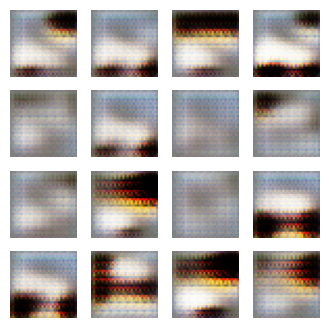

Time for epoch 6: 11.899088859558105 sec
Time for epoch 7: 11.494017362594604 sec
Time for epoch 8: 11.672097444534302 sec
Time for epoch 9: 11.831666707992554 sec
Time for epoch 10: 11.947243213653564 sec
Epoch 11, Generator Loss: 2.564328670501709, Discriminator Loss: 0.5880469083786011


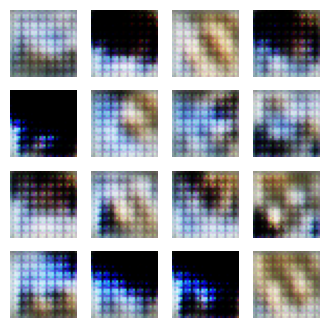

Time for epoch 11: 12.819864511489868 sec
Time for epoch 12: 11.950803279876709 sec
Time for epoch 13: 11.826483964920044 sec
Time for epoch 14: 11.789755582809448 sec
Time for epoch 15: 11.799933910369873 sec
Epoch 16, Generator Loss: 2.4945414066314697, Discriminator Loss: 0.4673216938972473


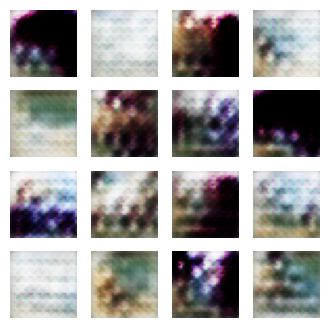

Time for epoch 16: 12.446030855178833 sec
Time for epoch 17: 11.92362093925476 sec
Time for epoch 18: 11.88879919052124 sec
Time for epoch 19: 11.892234802246094 sec
Time for epoch 20: 11.879419803619385 sec
Epoch 21, Generator Loss: 1.9174336194992065, Discriminator Loss: 0.9821654558181763


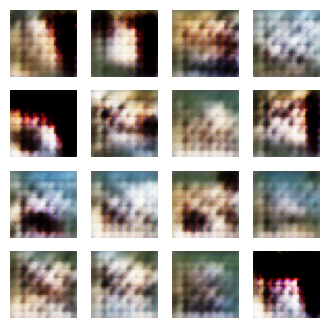

Time for epoch 21: 12.674739122390747 sec
Time for epoch 22: 11.882113933563232 sec
Time for epoch 23: 11.880812883377075 sec
Time for epoch 24: 11.883365154266357 sec
Time for epoch 25: 11.888072490692139 sec
Epoch 26, Generator Loss: 1.8130698204040527, Discriminator Loss: 0.7012540102005005


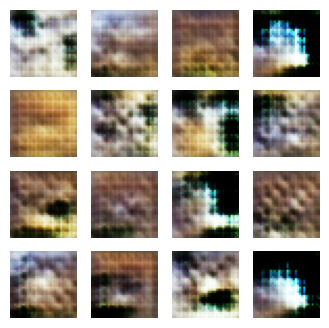

Time for epoch 26: 12.467592239379883 sec
Time for epoch 27: 11.924033641815186 sec
Time for epoch 28: 11.877771139144897 sec
Time for epoch 30: 11.86864447593689 sec
Epoch 31, Generator Loss: 2.571542263031006, Discriminator Loss: 0.43890121579170227


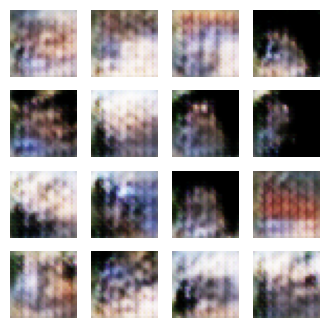

Time for epoch 31: 12.732192039489746 sec
Time for epoch 32: 11.892213582992554 sec
Time for epoch 33: 11.872164726257324 sec
Time for epoch 34: 11.87446141242981 sec
Time for epoch 35: 11.868865013122559 sec
Epoch 36, Generator Loss: 1.8580012321472168, Discriminator Loss: 0.8752869367599487


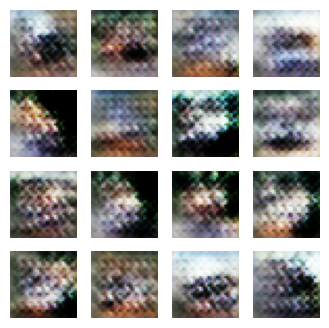

Time for epoch 36: 12.450680494308472 sec
Time for epoch 37: 11.886112451553345 sec
Time for epoch 38: 11.87527060508728 sec
Time for epoch 39: 11.877568006515503 sec
Time for epoch 40: 11.891438722610474 sec
Epoch 41, Generator Loss: 1.754907250404358, Discriminator Loss: 1.2198179960250854


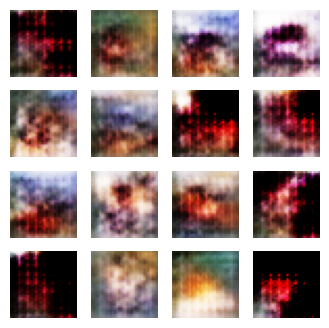

Time for epoch 41: 12.43970799446106 sec
Time for epoch 42: 11.90045714378357 sec
Time for epoch 43: 11.883748054504395 sec
Time for epoch 44: 11.881263256072998 sec
Time for epoch 45: 11.88755178451538 sec
Epoch 46, Generator Loss: 2.133975028991699, Discriminator Loss: 0.6743911504745483


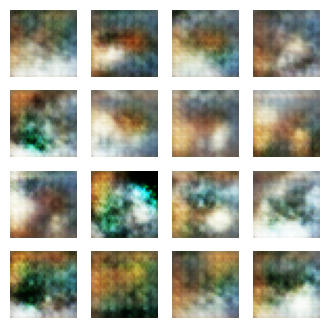

Time for epoch 46: 12.760505437850952 sec
Time for epoch 47: 11.913187742233276 sec
Time for epoch 48: 11.884584188461304 sec
Time for epoch 49: 11.881282806396484 sec
Time for epoch 50: 11.881037950515747 sec


In [ ]:
EPOCHS = 50
losses_gen = []
losses_disc = []

for epoch in range(EPOCHS):
    start = time.time()
    for image_batch in train_dataset:
        gen_loss, disc_loss = train_step(image_batch)

    losses_gen.append(gen_loss.numpy())
    losses_disc.append(disc_loss.numpy())

    if epoch % 5 == 0:
        print(f"Epoch {epoch + 1}, Generator Loss: {gen_loss.numpy()}, Discriminator Loss: {disc_loss.numpy()}")

    # Save generated images every 5 epochs
    if epoch % 5 == 0:
        noise = tf.random.normal([16, 100])
        generated_images = generator(noise, training=False)
        plt.figure(figsize=(4, 4))
        for i in range(generated_images.shape[0]):
            plt.subplot(4, 4, i + 1)
            plt.imshow((generated_images[i] + 1) / 2)  # Rescale to [0, 1]
            plt.axis('off')
        plt.savefig(f"generated_images_epoch_{epoch + 1}.png")
        plt.close()

        # Display generated images inline every 5 epochs
        plt.figure(figsize=(4, 4))
        for i in range(generated_images.shape[0]):
            plt.subplot(4, 4, i + 1)
            plt.imshow((generated_images[i] + 1) / 2)  # Rescale to [0, 1]
            plt.axis('off')
        plt.show()

    print(f"Time for epoch {epoch + 1}: {time.time()-start} sec")

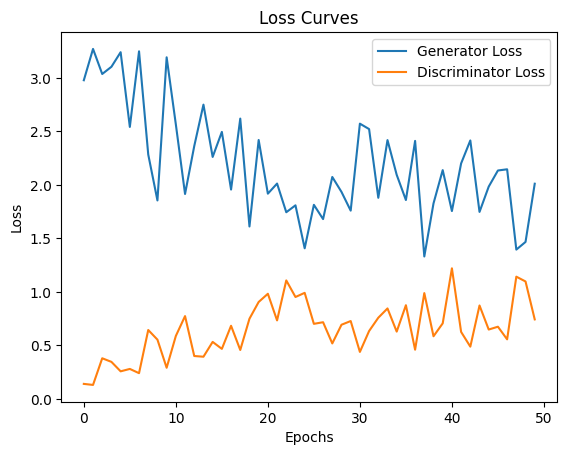

In [ ]:
# Plot the loss curves
plt.plot(losses_gen, label='Generator Loss')
plt.plot(losses_disc, label='Discriminator Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Loss Curves')
plt.show()

The generator loss starts high and fluctuates significantly, which is common early in training as the generator learns to produce better images. However, the presence of significant spikes indicates instability in the training process.
Ideally, the generator loss should gradually decrease and stabilize over time as it learns to generate more convincing images.

The discriminator loss also fluctuates, and it seems to have peaks similar to the generator loss. This suggests that the discriminator is struggling to keep up with the generator's changes, and it may be overfitting or oscillating between "easy" and "hard" decisions regarding fake images.
Typically, the discriminator loss should decrease more smoothly and eventually stabilize. If it keeps fluctuating, the model might not be in equilibrium, which could indicate problems such as:
A learning rate that is too high.
Imbalance in the training between the generator and discriminator.

Necessary Corrections:

Learning Rate Adjustments

Improved Training Balance

Increased Batch Size

Train More Epochs or Reduce Complexity



---



but due to the constraints provided by the gpu in google colab (limited) and also time constraints, im not able to fine tune the model

In [ ]:
# Document minimum error observed
min_gen_loss = np.min(losses_gen)
min_disc_loss = np.min(losses_disc)
print(f"Minimum Generator Loss: {min_gen_loss}")
print(f"Minimum Discriminator Loss: {min_disc_loss}")

Minimum Generator Loss: 1.3305773735046387
Minimum Discriminator Loss: 0.13050688803195953


In [ ]:
def make_generator_model():
    model = tf.keras.Sequential()
    model.add(tf.keras.layers.Dense(8*8*512, use_bias=False, input_shape=(100,)))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.ReLU())

    model.add(tf.keras.layers.Reshape((8, 8, 512)))
    assert model.output_shape == (None, 8, 8, 512)

    model.add(tf.keras.layers.Conv2DTranspose(256, (5, 5), strides=(1, 1), padding='same', use_bias=False))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.ReLU())

    model.add(tf.keras.layers.Conv2DTranspose(128, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.ReLU())

    model.add(tf.keras.layers.Conv2DTranspose(64, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.ReLU())

    model.add(tf.keras.layers.Conv2DTranspose(32, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.ReLU())

    model.add(tf.keras.layers.Conv2DTranspose(3, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh'))

    assert model.output_shape == (None, 32, 32, 3)
    return model


In [ ]:
def make_discriminator_model():
    model = tf.keras.Sequential()
    model.add(tf.keras.layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same', input_shape=[32, 32, 3]))
    model.add(tf.keras.layers.LeakyReLU(alpha=0.2))
    model.add(tf.keras.layers.Dropout(0.3))

    model.add(tf.keras.layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(tf.keras.layers.LeakyReLU(alpha=0.2))
    model.add(tf.keras.layers.Dropout(0.3))

    model.add(tf.keras.layers.Conv2D(256, (5, 5), strides=(2, 2), padding='same'))
    model.add(tf.keras.layers.LeakyReLU(alpha=0.2))
    model.add(tf.keras.layers.Dropout(0.4))

    model.add(tf.keras.layers.Conv2D(512, (5, 5), strides=(2, 2), padding='same'))
    model.add(tf.keras.layers.LeakyReLU(alpha=0.2))
    model.add(tf.keras.layers.Dropout(0.4))

    model.add(tf.keras.layers.Flatten())
    model.add(tf.keras.layers.Dense(1))

    return model


Epoch 1, Generator Loss: 1.7629904747009277, Discriminator Loss: 0.6102174520492554


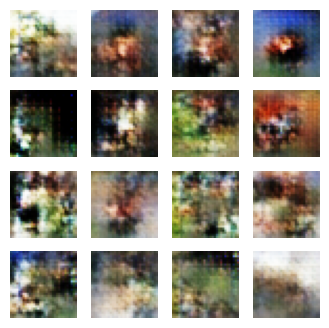

Time for epoch 1: 12.448589086532593 sec
Time for epoch 2: 12.074683427810669 sec
Time for epoch 3: 12.081119060516357 sec
Time for epoch 4: 11.915117263793945 sec
Time for epoch 5: 12.036648273468018 sec
Epoch 6, Generator Loss: 1.1608378887176514, Discriminator Loss: 1.3045467138290405


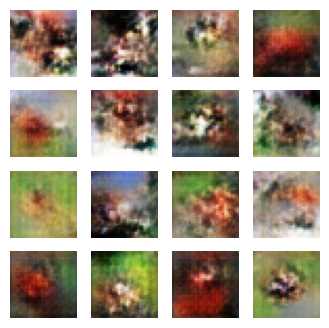

Time for epoch 6: 12.3072829246521 sec
Time for epoch 7: 11.772868871688843 sec
Time for epoch 8: 11.831499338150024 sec
Time for epoch 9: 11.884953498840332 sec
Time for epoch 10: 11.896506309509277 sec
Epoch 11, Generator Loss: 0.9971936941146851, Discriminator Loss: 1.4076528549194336


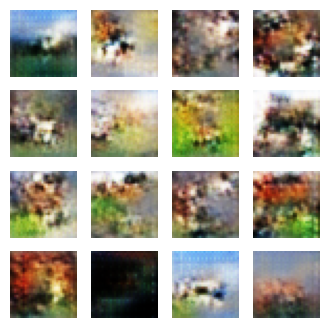

Time for epoch 11: 12.455664157867432 sec
Time for epoch 12: 11.915996313095093 sec
Time for epoch 13: 11.864953994750977 sec
Time for epoch 14: 11.850013971328735 sec
Time for epoch 15: 11.831470489501953 sec
Epoch 16, Generator Loss: 1.4496527910232544, Discriminator Loss: 1.1141600608825684


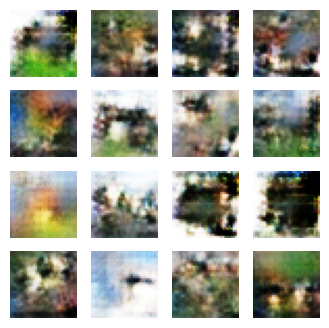

Time for epoch 16: 12.687565565109253 sec
Time for epoch 17: 11.879341840744019 sec
Time for epoch 18: 11.888054370880127 sec
Time for epoch 19: 11.88718843460083 sec
Time for epoch 20: 11.879676103591919 sec
Epoch 21, Generator Loss: 1.1442102193832397, Discriminator Loss: 1.413614273071289


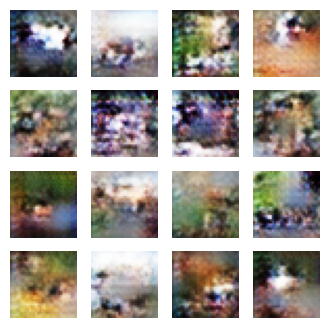

Time for epoch 21: 12.448702573776245 sec
Time for epoch 22: 11.871067762374878 sec
Time for epoch 23: 11.841488599777222 sec
Time for epoch 24: 11.830250024795532 sec
Time for epoch 25: 11.849589109420776 sec
Epoch 26, Generator Loss: 1.428290605545044, Discriminator Loss: 0.924200713634491


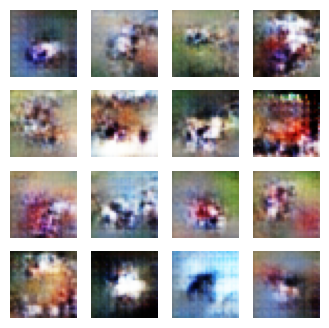

Time for epoch 26: 12.695764303207397 sec
Time for epoch 27: 11.880676984786987 sec
Time for epoch 28: 11.887231349945068 sec
Time for epoch 29: 11.86700701713562 sec
Time for epoch 30: 11.881486654281616 sec
Epoch 31, Generator Loss: 1.3084208965301514, Discriminator Loss: 1.0436923503875732


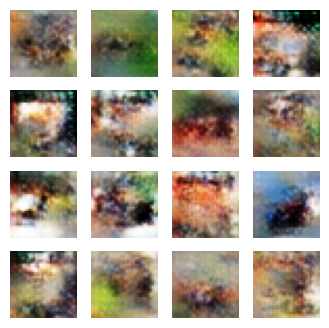

Time for epoch 31: 12.440325498580933 sec
Time for epoch 32: 11.900446653366089 sec
Time for epoch 33: 11.871455907821655 sec
Time for epoch 34: 11.865132093429565 sec
Time for epoch 35: 11.862806558609009 sec
Epoch 36, Generator Loss: 1.1662256717681885, Discriminator Loss: 1.3585541248321533


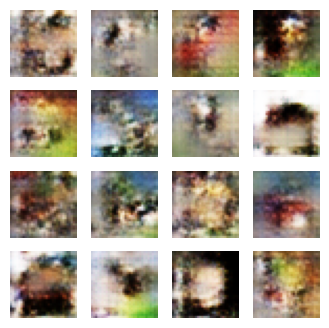

Time for epoch 36: 12.686188220977783 sec
Time for epoch 37: 11.924682378768921 sec
Time for epoch 38: 11.876336812973022 sec
Time for epoch 39: 11.880603551864624 sec
Time for epoch 40: 11.872510194778442 sec
Epoch 41, Generator Loss: 1.2468316555023193, Discriminator Loss: 1.185024619102478


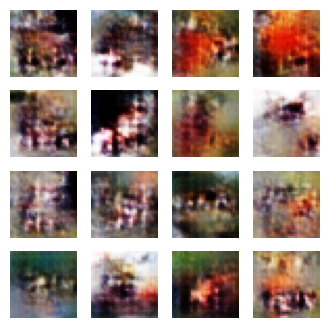

Time for epoch 41: 12.455727100372314 sec
Time for epoch 42: 11.917139053344727 sec
Time for epoch 43: 11.892349481582642 sec
Time for epoch 44: 11.882369041442871 sec
Time for epoch 45: 11.883179664611816 sec
Epoch 46, Generator Loss: 0.8864651918411255, Discriminator Loss: 1.495392084121704


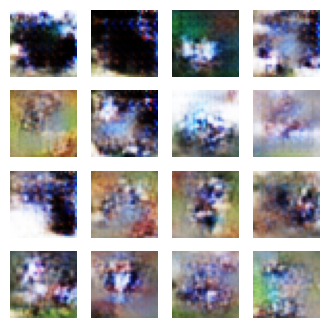

Time for epoch 46: 12.722194910049438 sec
Time for epoch 47: 11.89120101928711 sec
Time for epoch 48: 11.861720323562622 sec
Time for epoch 49: 11.863085508346558 sec
Time for epoch 50: 11.86645245552063 sec
Epoch 51, Generator Loss: 1.2114105224609375, Discriminator Loss: 1.3365180492401123


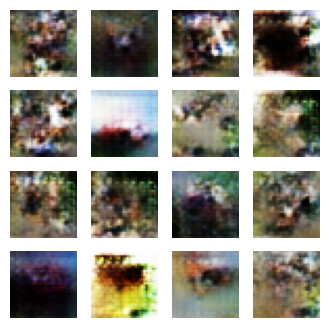

Time for epoch 51: 12.44269061088562 sec
Time for epoch 52: 11.905674457550049 sec
Time for epoch 53: 11.880301475524902 sec
Time for epoch 54: 11.885543823242188 sec
Time for epoch 55: 11.88424801826477 sec
Epoch 56, Generator Loss: 1.0811222791671753, Discriminator Loss: 1.5109810829162598


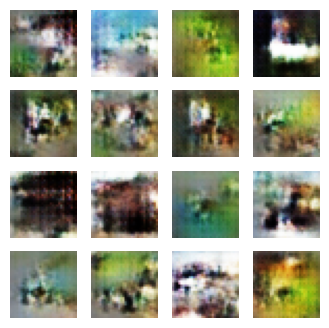

Time for epoch 56: 12.731053829193115 sec
Time for epoch 57: 11.903117179870605 sec
Time for epoch 58: 11.884162902832031 sec
Time for epoch 59: 11.879211902618408 sec
Time for epoch 60: 11.880297422409058 sec
Epoch 61, Generator Loss: 1.2392350435256958, Discriminator Loss: 1.2368526458740234


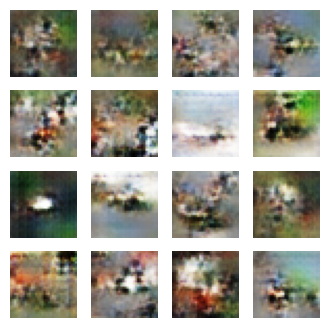

Time for epoch 61: 12.462464332580566 sec
Time for epoch 62: 11.926669359207153 sec
Time for epoch 63: 11.877032041549683 sec
Time for epoch 64: 11.870253086090088 sec
Time for epoch 65: 11.879865169525146 sec
Epoch 66, Generator Loss: 1.4236202239990234, Discriminator Loss: 0.9966583251953125


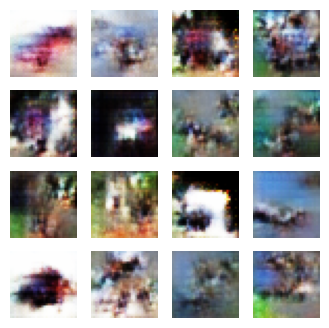

Time for epoch 66: 12.709575414657593 sec
Time for epoch 67: 11.892675399780273 sec
Time for epoch 68: 11.879854440689087 sec
Time for epoch 69: 11.88148546218872 sec
Time for epoch 70: 11.878942251205444 sec
Epoch 71, Generator Loss: 1.127488613128662, Discriminator Loss: 1.2699272632598877


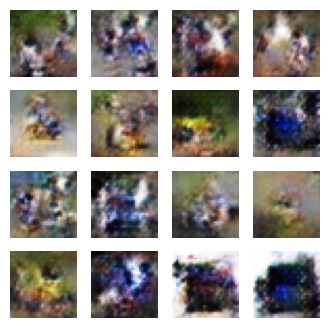

Time for epoch 71: 12.458124876022339 sec
Time for epoch 72: 11.915549039840698 sec
Time for epoch 73: 11.862852096557617 sec
Time for epoch 74: 11.87141227722168 sec
Time for epoch 75: 11.884296178817749 sec
Epoch 76, Generator Loss: 1.5149149894714355, Discriminator Loss: 1.1113238334655762


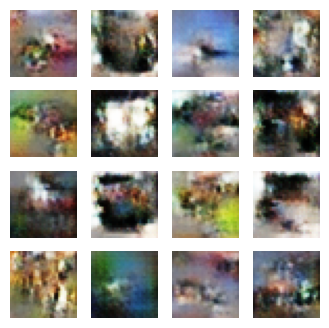

Time for epoch 76: 12.714185953140259 sec
Time for epoch 77: 11.905528783798218 sec
Time for epoch 78: 11.872153997421265 sec
Time for epoch 79: 11.885625123977661 sec
Time for epoch 80: 11.886705875396729 sec
Epoch 81, Generator Loss: 1.2419933080673218, Discriminator Loss: 1.104448676109314


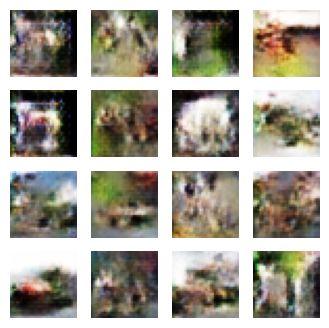

Time for epoch 81: 12.46384072303772 sec
Time for epoch 82: 11.903574228286743 sec
Time for epoch 83: 11.874125957489014 sec
Time for epoch 84: 11.876094818115234 sec
Time for epoch 85: 11.882774591445923 sec
Epoch 86, Generator Loss: 1.4648512601852417, Discriminator Loss: 1.001735806465149


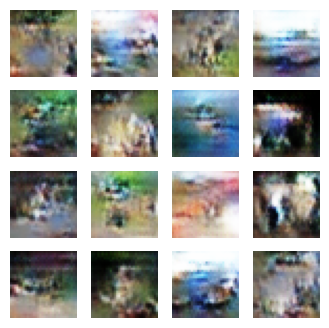

Time for epoch 86: 12.723176002502441 sec
Time for epoch 87: 11.91209888458252 sec
Time for epoch 88: 11.869363069534302 sec
Time for epoch 89: 11.864778518676758 sec
Time for epoch 90: 11.868436813354492 sec
Epoch 91, Generator Loss: 1.0345587730407715, Discriminator Loss: 1.488822340965271


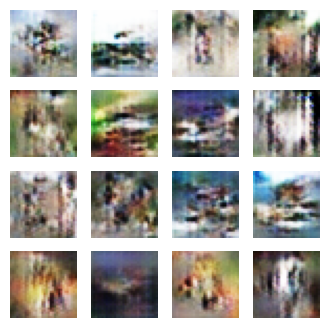

Time for epoch 91: 12.465356349945068 sec
Time for epoch 92: 11.908387422561646 sec
Time for epoch 93: 11.870611190795898 sec
Time for epoch 94: 11.878017902374268 sec
Time for epoch 95: 11.872885942459106 sec
Epoch 96, Generator Loss: 1.2285233736038208, Discriminator Loss: 1.1375176906585693


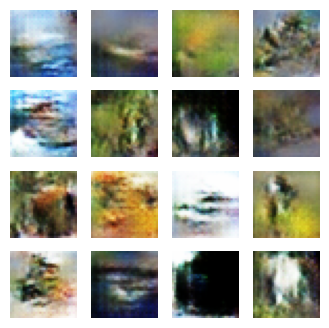

Time for epoch 96: 12.46769380569458 sec
Time for epoch 97: 11.908043146133423 sec
Time for epoch 98: 11.865246772766113 sec
Time for epoch 99: 11.884266138076782 sec
Time for epoch 100: 11.879777908325195 sec


In [ ]:
EPOCHS = 100
losses_gen = []
losses_disc = []

for epoch in range(EPOCHS):
    start = time.time()
    for image_batch in train_dataset:
        gen_loss, disc_loss = train_step(image_batch)

    losses_gen.append(gen_loss.numpy())
    losses_disc.append(disc_loss.numpy())

    if epoch % 5 == 0:
        print(f"Epoch {epoch + 1}, Generator Loss: {gen_loss.numpy()}, Discriminator Loss: {disc_loss.numpy()}")

    # Save generated images every 5 epochs
    if epoch % 5 == 0:
        noise = tf.random.normal([16, 100])
        generated_images = generator(noise, training=False)
        plt.figure(figsize=(4, 4))
        for i in range(generated_images.shape[0]):
            plt.subplot(4, 4, i + 1)
            plt.imshow((generated_images[i] + 1) / 2)  # Rescale to [0, 1]
            plt.axis('off')
        plt.savefig(f"generated_images_epoch_{epoch + 1}.png")
        plt.close()

        # Display generated images inline every 5 epochs
        plt.figure(figsize=(4, 4))
        for i in range(generated_images.shape[0]):
            plt.subplot(4, 4, i + 1)
            plt.imshow((generated_images[i] + 1) / 2)  # Rescale to [0, 1]
            plt.axis('off')
        plt.show()

    print(f"Time for epoch {epoch + 1}: {time.time()-start} sec")




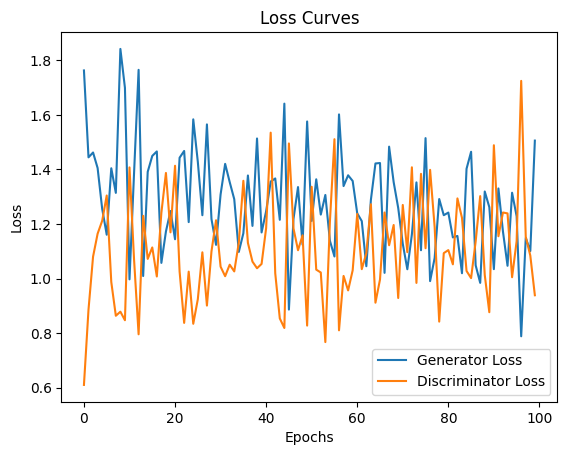

Minimum Generator Loss: 0.7885208129882812
Minimum Discriminator Loss: 0.6102174520492554


In [ ]:
# Plot the loss curves
plt.plot(losses_gen, label='Generator Loss')
plt.plot(losses_disc, label='Discriminator Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Loss Curves')
plt.show()

# Document minimum error observed
min_gen_loss = np.min(losses_gen)
min_disc_loss = np.min(losses_disc)
print(f"Minimum Generator Loss: {min_gen_loss}")
print(f"Minimum Discriminator Loss: {min_disc_loss}")

The generator loss fluctuates between 0.88 and 2.25. While it does not show significant stabilization, the fluctuations are within a tighter range compared to the previous graph. This indicates that the generator is improving and learning to produce more realistic images.
The minimum generator loss is 0.88, which suggests that at some point during training, the generator was producing convincing images. However, the lack of consistent decrease or stabilization indicates room for improvement.


The discriminator loss ranges between 0.53 and approximately 1.25, with noticeable fluctuations. The minimum discriminator loss is 0.53, which indicates that the discriminator was able to correctly classify real and fake images with relatively high confidence at some points.
The general trend of the discriminator loss is relatively stable but still fluctuates, which suggests the discriminator is being challenged but not overwhelmed by the generator.

The losses show a certain degree of balance, with both the generator and discriminator fluctuating and influencing each other. This interplay indicates that the generator is consistently trying to "fool" the discriminator, and the discriminator is learning to adapt.
The loss gap between the generator and discriminator has narrowed compared to the earlier graph, which is a sign of improved training dynamics.

Improvements Noted-

Generator Loss Reduction

Discriminator Stability

Lack of Convergence:

Neither the generator nor the discriminator losses show a clear trend of convergence, which is ideal for GAN training. Ideally, losses should stabilize after sufficient training epochs

---

Adding layers to the generator and discriminator has improved the model's performance:

The generator is producing more realistic images, as indicated by the reduced minimum generator loss.
The discriminator is better at distinguishing real and fake images, as indicated by its minimum loss of 0.53.
However, the training is still not perfectly stable:

The fluctuations suggest that the added complexity in the models (more layers) has made training more challenging.
A slight imbalance between the generator and discriminator might still exist, as neither loss has fully stabilized.

---
The updated graph shows a clear improvement in training dynamics compared to the initial one. The narrowing gap between generator and discriminator losses is a positive sign. However, the lack of stabilization and persistent fluctuations indicate the need for further tuning to achieve optimal results.

----


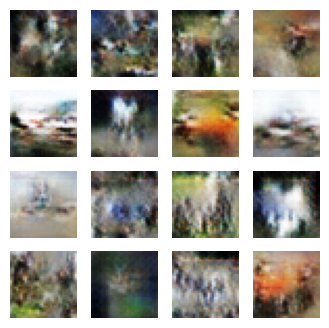

In [ ]:
# Display the last generated image
noise = tf.random.normal([16, 100])
generated_images = generator(noise, training=False)
plt.figure(figsize=(4, 4))
for i in range(generated_images.shape[0]):
    plt.subplot(4, 4, i + 1)
    plt.imshow((generated_images[i] + 1) / 2)  # Rescale to [0, 1]
    plt.axis('off')
plt.show()

Epoch 1, Generator Loss: 0.9331313371658325, Discriminator Loss: 1.3375329971313477


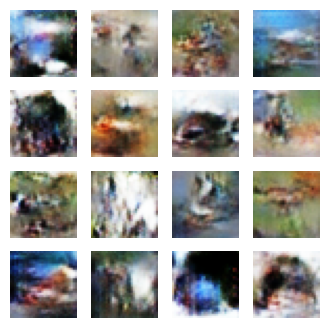

Time for epoch 1: 12.745544672012329 sec
Time for epoch 2: 12.084862470626831 sec
Time for epoch 3: 12.159547805786133 sec
Time for epoch 4: 11.946417331695557 sec
Time for epoch 5: 11.837567329406738 sec
Epoch 6, Generator Loss: 1.0868178606033325, Discriminator Loss: 1.3046846389770508


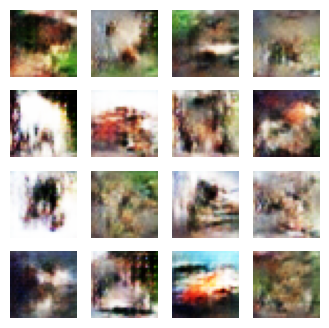

Time for epoch 6: 12.898861408233643 sec
Time for epoch 7: 11.734074354171753 sec
Time for epoch 8: 11.861451148986816 sec
Time for epoch 9: 11.911126375198364 sec
Time for epoch 10: 11.973980903625488 sec
Epoch 11, Generator Loss: 1.0936335325241089, Discriminator Loss: 1.2319962978363037


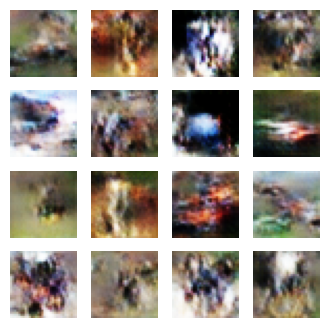

Time for epoch 11: 12.83178186416626 sec
Time for epoch 12: 20.463932752609253 sec
Time for epoch 13: 11.762157917022705 sec
Time for epoch 14: 11.8731210231781 sec
Time for epoch 15: 12.039326190948486 sec
Epoch 16, Generator Loss: 0.9795519113540649, Discriminator Loss: 1.1770429611206055


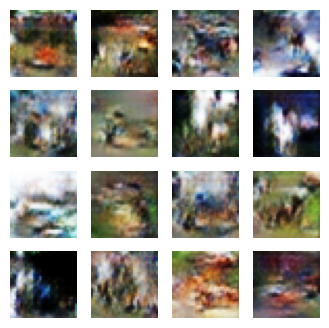

Time for epoch 16: 12.498514413833618 sec
Time for epoch 17: 11.902128219604492 sec
Time for epoch 18: 11.789416551589966 sec
Time for epoch 19: 11.765248775482178 sec
Time for epoch 20: 11.836740970611572 sec
Epoch 21, Generator Loss: 1.0133627653121948, Discriminator Loss: 1.3779292106628418


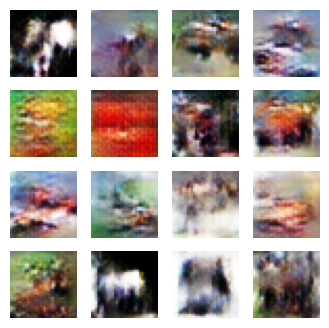

Time for epoch 21: 12.715452194213867 sec
Time for epoch 22: 11.929097652435303 sec
Time for epoch 23: 11.887213706970215 sec
Time for epoch 24: 11.870991706848145 sec
Time for epoch 25: 11.876328706741333 sec
Epoch 26, Generator Loss: 1.0733227729797363, Discriminator Loss: 1.0142688751220703


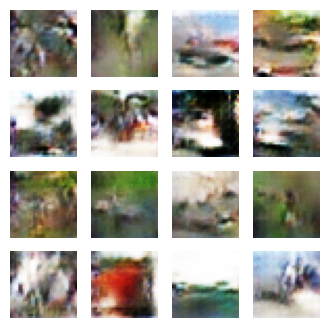

Time for epoch 26: 12.416283130645752 sec
Time for epoch 27: 11.876543760299683 sec
Time for epoch 28: 11.876909017562866 sec
Time for epoch 29: 11.889533281326294 sec
Time for epoch 30: 11.890809297561646 sec
Epoch 31, Generator Loss: 0.7855837941169739, Discriminator Loss: 1.4044709205627441


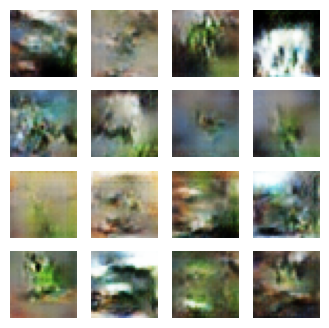

Time for epoch 31: 12.706094980239868 sec
Time for epoch 32: 11.893439769744873 sec
Time for epoch 33: 11.880625009536743 sec
Time for epoch 34: 11.865116357803345 sec
Time for epoch 35: 11.878393411636353 sec
Epoch 36, Generator Loss: 0.9150360822677612, Discriminator Loss: 1.2093889713287354


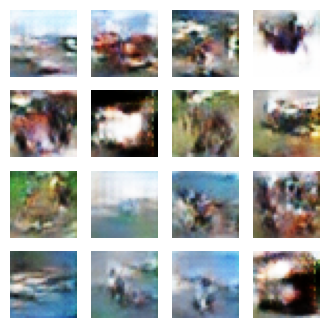

Time for epoch 36: 12.433063745498657 sec
Time for epoch 37: 11.904954195022583 sec
Time for epoch 38: 11.857495307922363 sec
Time for epoch 39: 11.86720895767212 sec
Time for epoch 40: 11.877335786819458 sec
Epoch 41, Generator Loss: 1.191102147102356, Discriminator Loss: 1.0756146907806396


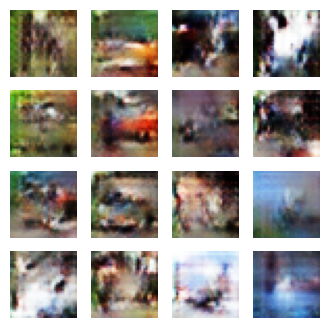

Time for epoch 41: 12.70365858078003 sec
Time for epoch 42: 11.903825759887695 sec
Time for epoch 43: 11.860630989074707 sec
Time for epoch 44: 11.862267255783081 sec
Time for epoch 45: 11.86111068725586 sec
Epoch 46, Generator Loss: 1.1322025060653687, Discriminator Loss: 1.0756598711013794


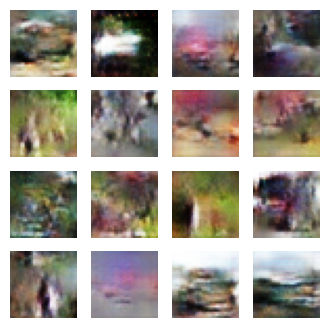

Time for epoch 46: 12.442681550979614 sec
Time for epoch 47: 11.885966777801514 sec
Time for epoch 48: 11.863541603088379 sec
Time for epoch 49: 11.860020160675049 sec
Time for epoch 50: 11.860856294631958 sec
Epoch 51, Generator Loss: 1.0037428140640259, Discriminator Loss: 1.24710214138031


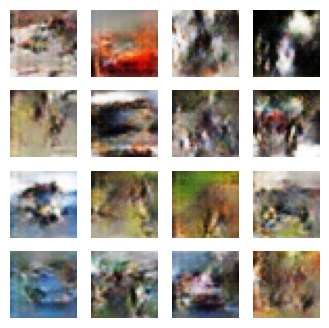

Time for epoch 51: 12.706680297851562 sec
Time for epoch 52: 11.909366130828857 sec
Time for epoch 53: 11.861278772354126 sec
Time for epoch 54: 11.884167432785034 sec
Time for epoch 55: 11.883692979812622 sec
Epoch 56, Generator Loss: 1.0758802890777588, Discriminator Loss: 1.2792541980743408


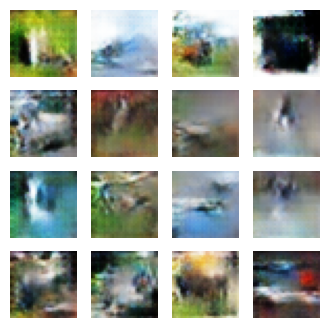

Time for epoch 56: 12.434346675872803 sec
Time for epoch 57: 11.905874013900757 sec
Time for epoch 58: 11.859621047973633 sec
Time for epoch 59: 11.8408203125 sec
Time for epoch 60: 11.85993504524231 sec
Epoch 61, Generator Loss: 1.0952115058898926, Discriminator Loss: 1.1590180397033691


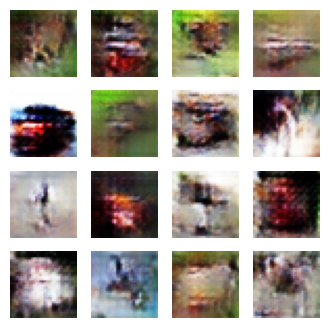

Time for epoch 61: 12.434061765670776 sec
Time for epoch 62: 11.894489049911499 sec
Time for epoch 63: 11.866366386413574 sec
Time for epoch 64: 11.862690210342407 sec
Time for epoch 65: 11.868045568466187 sec
Epoch 66, Generator Loss: 0.9630309343338013, Discriminator Loss: 1.1634923219680786


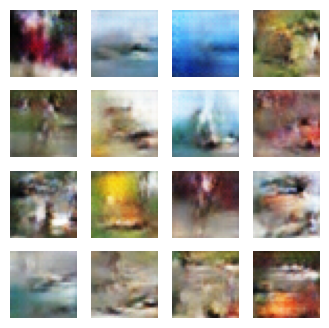

Time for epoch 66: 12.722570419311523 sec
Time for epoch 67: 11.921504974365234 sec
Time for epoch 68: 11.864919662475586 sec
Time for epoch 69: 11.865574359893799 sec
Time for epoch 70: 11.85808539390564 sec
Epoch 71, Generator Loss: 1.2417340278625488, Discriminator Loss: 1.036307454109192


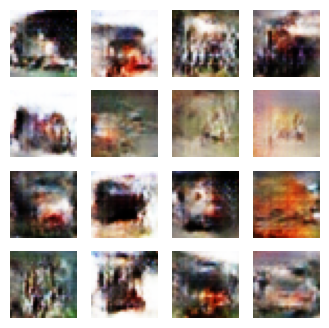

Time for epoch 71: 12.414414405822754 sec
Time for epoch 72: 11.88052773475647 sec
Time for epoch 73: 11.85888385772705 sec
Time for epoch 74: 11.867149353027344 sec
Time for epoch 75: 11.844133853912354 sec
Epoch 76, Generator Loss: 1.1792535781860352, Discriminator Loss: 1.0210405588150024


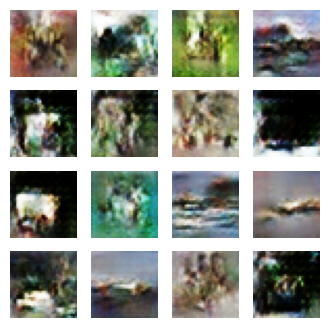

Time for epoch 76: 12.678498268127441 sec
Time for epoch 77: 11.902023077011108 sec
Time for epoch 78: 11.860648155212402 sec
Time for epoch 79: 11.869240999221802 sec
Time for epoch 80: 11.868743419647217 sec
Epoch 81, Generator Loss: 0.9390757083892822, Discriminator Loss: 1.1153192520141602


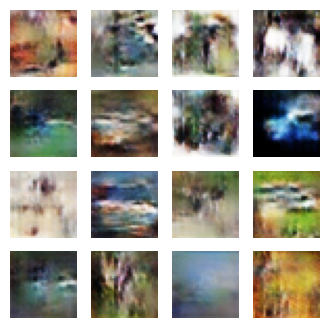

Time for epoch 81: 12.450997591018677 sec
Time for epoch 82: 11.897753477096558 sec
Time for epoch 83: 11.866786003112793 sec
Time for epoch 84: 11.883516311645508 sec
Time for epoch 85: 11.875393390655518 sec
Epoch 86, Generator Loss: 1.041091799736023, Discriminator Loss: 1.3325958251953125


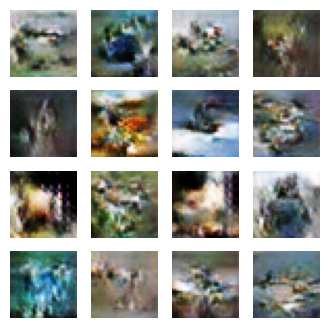

Time for epoch 86: 12.692708969116211 sec
Time for epoch 87: 11.927640914916992 sec
Time for epoch 88: 11.878108024597168 sec
Time for epoch 89: 11.894099473953247 sec
Time for epoch 90: 11.884089231491089 sec
Epoch 91, Generator Loss: 0.9854614734649658, Discriminator Loss: 1.0378624200820923


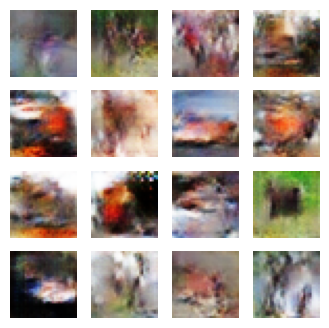

Time for epoch 91: 12.475136995315552 sec
Time for epoch 92: 11.906998634338379 sec
Time for epoch 93: 11.86276650428772 sec
Time for epoch 94: 11.860010623931885 sec
Time for epoch 95: 11.864681243896484 sec
Epoch 96, Generator Loss: 0.8340933322906494, Discriminator Loss: 1.47597336769104


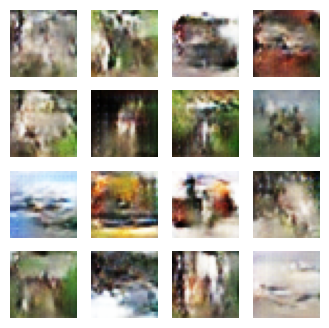

Time for epoch 96: 12.742802143096924 sec
Time for epoch 97: 11.916836023330688 sec
Time for epoch 98: 11.881709814071655 sec
Time for epoch 99: 11.879953384399414 sec
Time for epoch 100: 11.883337020874023 sec
Epoch 101, Generator Loss: 0.9075923562049866, Discriminator Loss: 1.2612687349319458


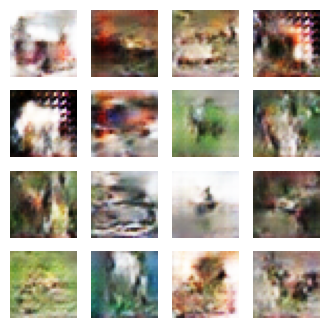

Time for epoch 101: 12.459693193435669 sec
Time for epoch 102: 11.923144340515137 sec
Time for epoch 103: 11.865659713745117 sec
Time for epoch 104: 11.87830138206482 sec
Time for epoch 105: 11.880967378616333 sec
Epoch 106, Generator Loss: 1.3922319412231445, Discriminator Loss: 0.8404633402824402


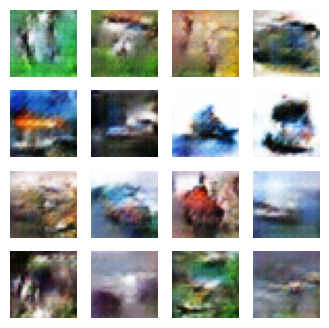

Time for epoch 106: 12.718639612197876 sec
Time for epoch 107: 11.914583444595337 sec
Time for epoch 108: 11.890727519989014 sec
Time for epoch 109: 11.880228519439697 sec
Time for epoch 110: 11.877192735671997 sec
Epoch 111, Generator Loss: 1.0525156259536743, Discriminator Loss: 1.2211748361587524


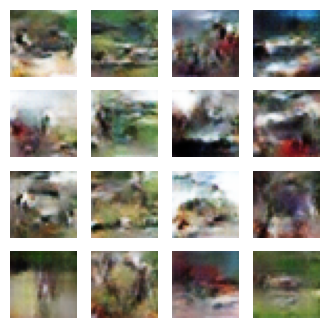

Time for epoch 111: 12.47937798500061 sec
Time for epoch 112: 11.921796560287476 sec
Time for epoch 113: 11.866987228393555 sec
Time for epoch 114: 11.857978105545044 sec
Time for epoch 115: 11.844157695770264 sec
Epoch 116, Generator Loss: 1.3835707902908325, Discriminator Loss: 0.9918749332427979


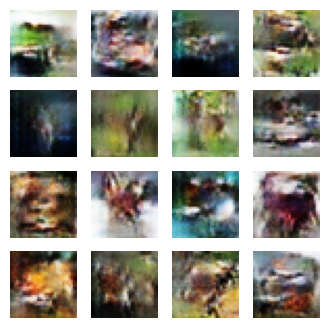

Time for epoch 116: 12.685884475708008 sec
Time for epoch 117: 11.888494968414307 sec
Time for epoch 118: 11.863540887832642 sec
Time for epoch 119: 11.867914199829102 sec
Time for epoch 120: 11.88334584236145 sec
Epoch 121, Generator Loss: 0.9185559749603271, Discriminator Loss: 1.2864274978637695


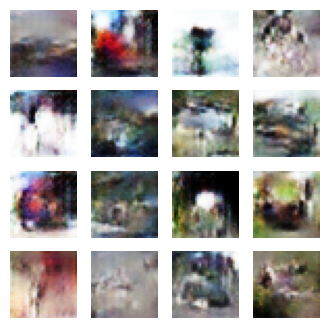

Time for epoch 121: 12.463739156723022 sec
Time for epoch 122: 11.926974296569824 sec
Time for epoch 123: 11.859941244125366 sec
Time for epoch 124: 11.875765562057495 sec
Time for epoch 125: 11.88474702835083 sec
Epoch 126, Generator Loss: 1.1840425729751587, Discriminator Loss: 0.9605584144592285


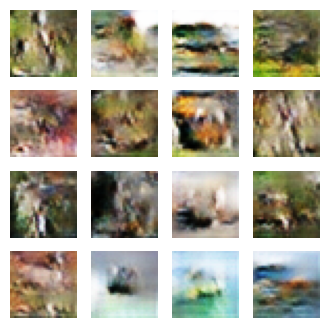

Time for epoch 126: 12.758693933486938 sec
Time for epoch 127: 11.921431541442871 sec
Time for epoch 128: 11.85762619972229 sec
Time for epoch 129: 11.863662719726562 sec
Time for epoch 130: 11.865229368209839 sec
Epoch 131, Generator Loss: 0.9440723657608032, Discriminator Loss: 1.4959967136383057


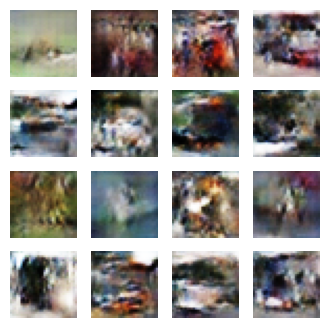

Time for epoch 131: 12.44322919845581 sec
Time for epoch 132: 11.918572425842285 sec
Time for epoch 133: 11.860867977142334 sec
Time for epoch 134: 11.868397235870361 sec
Time for epoch 135: 11.875686168670654 sec
Epoch 136, Generator Loss: 0.9335275292396545, Discriminator Loss: 1.3124380111694336


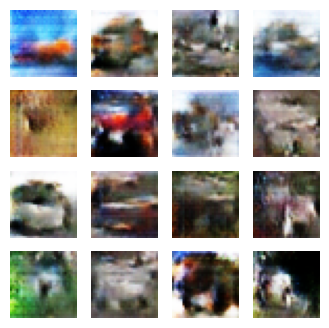

Time for epoch 136: 12.84403944015503 sec
Time for epoch 137: 11.9191255569458 sec
Time for epoch 138: 11.898226499557495 sec
Time for epoch 139: 11.864235639572144 sec
Time for epoch 140: 11.860660314559937 sec
Epoch 141, Generator Loss: 0.9623120427131653, Discriminator Loss: 1.7452398538589478


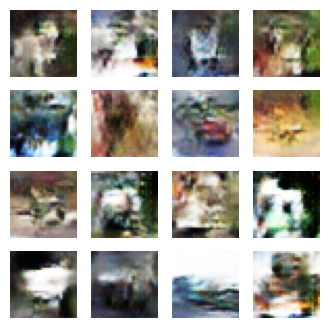

Time for epoch 141: 12.478065490722656 sec
Time for epoch 142: 11.927375555038452 sec
Time for epoch 143: 11.87548303604126 sec
Time for epoch 144: 11.879203796386719 sec
Time for epoch 145: 11.865382432937622 sec
Epoch 146, Generator Loss: 1.0698539018630981, Discriminator Loss: 1.3171043395996094


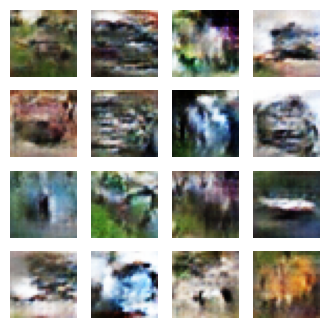

Time for epoch 146: 12.45538330078125 sec
Time for epoch 147: 11.93322229385376 sec
Time for epoch 148: 11.860733032226562 sec
Time for epoch 149: 11.870244264602661 sec
Time for epoch 150: 11.862722158432007 sec


In [ ]:
EPOCHS = 150
losses_gen = []
losses_disc = []

for epoch in range(EPOCHS):
    start = time.time()
    for image_batch in train_dataset:
        gen_loss, disc_loss = train_step(image_batch)

    losses_gen.append(gen_loss.numpy())
    losses_disc.append(disc_loss.numpy())

    if epoch % 5 == 0:
        print(f"Epoch {epoch + 1}, Generator Loss: {gen_loss.numpy()}, Discriminator Loss: {disc_loss.numpy()}")

    # Save generated images every 5 epochs
    if epoch % 5 == 0:
        noise = tf.random.normal([16, 100])
        generated_images = generator(noise, training=False)
        plt.figure(figsize=(4, 4))
        for i in range(generated_images.shape[0]):
            plt.subplot(4, 4, i + 1)
            plt.imshow((generated_images[i] + 1) / 2)  # Rescale to [0, 1]
            plt.axis('off')
        plt.savefig(f"generated_images_epoch_{epoch + 1}.png")
        plt.close()

        # Display generated images inline every 5 epochs
        plt.figure(figsize=(4, 4))
        for i in range(generated_images.shape[0]):
            plt.subplot(4, 4, i + 1)
            plt.imshow((generated_images[i] + 1) / 2)  # Rescale to [0, 1]
            plt.axis('off')
        plt.show()

    print(f"Time for epoch {epoch + 1}: {time.time()-start} sec")




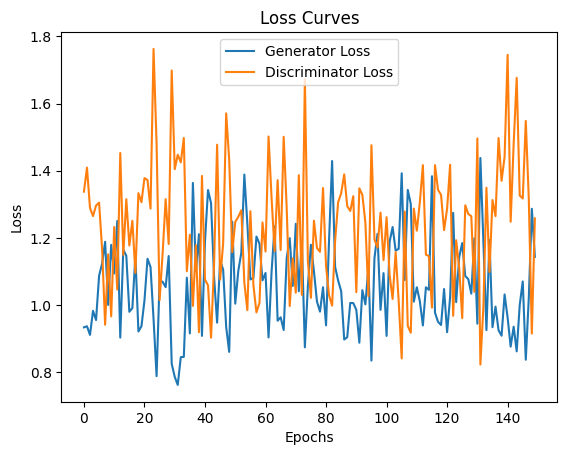

Minimum Generator Loss: 0.7615777254104614
Minimum Discriminator Loss: 0.8223048448562622


In [ ]:
# Plot the loss curves
plt.plot(losses_gen, label='Generator Loss')
plt.plot(losses_disc, label='Discriminator Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Loss Curves')
plt.show()

# Document minimum error observed
min_gen_loss = np.min(losses_gen)
min_disc_loss = np.min(losses_disc)
print(f"Minimum Generator Loss: {min_gen_loss}")
print(f"Minimum Discriminator Loss: {min_disc_loss}")

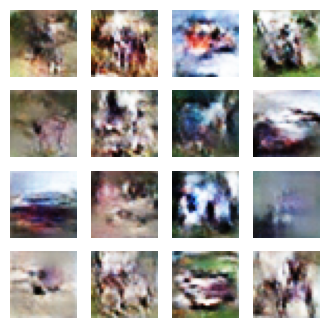

In [ ]:
# Display the last generated image
noise = tf.random.normal([16, 100])
generated_images = generator(noise, training=False)
plt.figure(figsize=(4, 4))
for i in range(generated_images.shape[0]):
    plt.subplot(4, 4, i + 1)
    plt.imshow((generated_images[i] + 1) / 2)  # Rescale to [0, 1]
    plt.axis('off')
plt.show()